In [65]:
import pandas as pd
import librosa
import matplotlib.pyplot as plt
import numpy as np
import json
import networkx as nx

from IPython.display import Audio

# MAT381E, HW4

## Q1

For this question we are going to use [Amazon Fine Foods reviews](http://snap.stanford.edu/data/web-FineFoods.html) from [Stanford Network Analysis Project (SNAP)](http://snap.stanford.edu/index.html). The dataset is very large (Approximately 500K entries).

Here is a sample of the data:

    product/productId: B001E4KFG0
    review/userId: A3SGXH7AUHU8GW
    review/profileName: delmartian
    review/helpfulness: 1/1
    review/score: 5.0
    review/time: 1303862400
    review/summary: Good Quality Dog Food
    review/text: I have bought several of the Vitality canned dog food products and have found them all to be of good quality. The product looks more like a stew than a processed meat and it smells better. My Labrador is finicky and she appreciates this product better than  most.

    product/productId: B00813GRG4
    review/userId: A1D87F6ZCVE5NK
    review/profileName: dll pa
    review/helpfulness: 0/0
    review/score: 1.0
    review/time: 1346976000
    review/summary: Not as Advertised
    review/text: Product arrived labeled as Jumbo Salted Peanuts...the peanuts were actually small sized unsalted. Not sure if this was an error or if the vendor intended to represent the product as "Jumbo".

    product/productId: B000LQOCH0
    review/userId: ABXLMWJIXXAIN
    review/profileName: Natalia Corres "Natalia Corres"
    review/helpfulness: 1/1
    review/score: 4.0
    review/time: 1219017600
    review/summary: "Delight" says it all
    review/text: This is a confection that has been around a few centuries.  It is a light, pillowy citrus gelatin with nuts - in this case Filberts. And it is cut into tiny squares and then liberally coated with powdered sugar.  And it is a tiny mouthful of heaven.  Not too chewy, and very flavorful. I highly recommend this yummy treat.  If you are familiar with the story of C.S. Lewis' "The Lion, The Witch, and The Wardro be" - this is the treat that seduces Edmund into selling out his Brother and Sisters to the Witch.


**Step 1:** Ingest the data as a dictionary as follows. You are going to have to write specific python code for injestion. I know no library for this purpose.

In [1]:
[{'product/productId': 'B001E4KFG0',
  'review/userId': 'A3SGXH7AUHU8GW',
  'review/profileName': 'delmartian',
  'review/helpfulness': '1/1',
  'review/score': 5.0,
  'review/time': 1303862400,
  'review/summary': 'Good Quality Dog Food',
  'review/text': 'I have bought several of the Vitality canned dog food products and have found them \
  all to be of good quality. The product looks more like a stew than a processed meat and it smells better. \
  My Labrador is finicky and she appreciates this product better than  most.'},
 {'product/productId': 'B00813GRG4',
  'review/userId': 'A1D87F6ZCVE5NK',
  'review/profileName': 'dll pa',
  'review/helpfulness': '0/0',
  'review/score': 1.0,
  'review/time': 1346976000,
  'review/summary': 'Not as Advertised',
  'review/text': 'Product arrived labeled as Jumbo Salted Peanuts...the peanuts were actually \
  small sized unsalted. Not sure if this was an error or if the vendor intended to represent the product as "Jumbo".'},
 {'product/productId': 'B000LQOCH0',
  'review/userId': 'ABXLMWJIXXAIN',
  'review/profileName': 'Natalia Corres "Natalia Corres"',
  'review/helpfulness': '1/1',
  'review/score': 4.0,
  'review/time': 1219017600,
  'review/summary': '"Delight" says it all',
  'review/text': 'This is a confection that has been around a few centuries.  It is a light, pillowy citrus gelatin \
with nuts - in this case Filberts. And it is cut into tiny squares and then liberally coated with pow \
dered sugar.  And it is a tiny mouthful of heaven.  Not too chewy, and very flavorful.  I highly recommend this yummy treat. \
If you are familiar with the story of C.S. Lewis "The Lion, The Witch, and The Wardro be" - \
this is the treat that seduces Edmund into selling out his Brother and Sisters to the Witch.'}
]

[{'product/productId': 'B001E4KFG0',
  'review/userId': 'A3SGXH7AUHU8GW',
  'review/profileName': 'delmartian',
  'review/helpfulness': '1/1',
  'review/score': 5.0,
  'review/time': 1303862400,
  'review/summary': 'Good Quality Dog Food',
  'review/text': 'I have bought several of the Vitality canned dog food products and have found them   all to be of good quality. The product looks more like a stew than a processed meat and it smells better.   My Labrador is finicky and she appreciates this product better than  most.'},
 {'product/productId': 'B00813GRG4',
  'review/userId': 'A1D87F6ZCVE5NK',
  'review/profileName': 'dll pa',
  'review/helpfulness': '0/0',
  'review/score': 1.0,
  'review/time': 1346976000,
  'review/summary': 'Not as Advertised',
  'review/text': 'Product arrived labeled as Jumbo Salted Peanuts...the peanuts were actually   small sized unsalted. Not sure if this was an error or if the vendor intended to represent the product as "Jumbo".'},
 {'product/productId': 'B

**Step 2:** Convert the injested JSON into a pandas dataframe.

**Step 3:** Calculate the average score for each product and store is as a pandas dataframe.

**Step 4:** From the original dataframe filter out (remove) all products that has less than 100 reviews. Get the resulting list of productId's. How many products do we have satisfying this condition?

**Step 5:** From the original dataframe filter out (remove) all users that has less than 50 reviews. Get the resulting list of userId's. How many users do we have satisfying this condition?

**Step 6:** On the original dataframe filter out (remove) all users that has less than 50 reviews and all products that has less than 100 reviews. Use the lists from Step 4 and 5.

**Step 7:** Create a pivot table for userId's vs productId's.

**Step 8:** Normalize each row by dividing each row with the sum of that row. Call the dataframe `result`

**Step 9:** Multiply `result` with its transpose `result.T` in two different ways. Now, you obtained two similarity matrices: one for users, the other for products.

**Step 10:** Construct a `networkx` network of users and a `networkx` network of products. Sketch the networks. Observe that these networks are too complicated to understand.

**Step 11:** Remove some edges by setting threshold for the similarity value. Experiment few values and choose an appropriate value, and sketch the final results for both user and product networks.

I am going to get the data as a dictionary...

In [3]:
# Initialize an empty list to store the dictionaries containing the key-value pairs for each review
data_list = []

# Initialize an empty dictionary to store the key-value pairs for the current review
data = {}

# Initialize an empty string to store the current review text
review_text = ''

# Open the file in read mode
with open('finefoods.txt', 'r', encoding='ISO-8859-1') as f:
    # Read the lines in the file one by one
    for line in f:
        # Split the line into a key-value pair
        key_value = line.split(':')
        if len(key_value) == 2:  # If the line contains a key-value pair
            key, value = key_value
            if key == 'product/productId':  # If the key is 'product/productId', it indicates the start of a new review
                data_list.append(data)  # Append the current data dictionary to the data_list
                data = {}  # Reset the data dictionary
                review_text = ''  # Reset the review_text string
            if key == 'review/text':  # If the key is 'review/text', append the value to the review_text string
                review_text += value
            else:  # Otherwise, add the key-value pair to the data dictionary
                data[key] = value
        else:  # If the line does not contain a key-value pair, it is a continuation of the review text
            review_text += line
    data['review/text'] = review_text  # Add the review text to the data dictionary
    data_list.append(data)  # Append the final data dictionary to the data_list

data_list



[{},
 {'product/productId': ' B001E4KFG0\n',
  'review/userId': ' A3SGXH7AUHU8GW\n',
  'review/profileName': ' delmartian\n',
  'review/helpfulness': ' 1/1\n',
  'review/score': ' 5.0\n',
  'review/time': ' 1303862400\n',
  'review/summary': ' Good Quality Dog Food\n'},
 {'product/productId': ' B00813GRG4\n',
  'review/userId': ' A1D87F6ZCVE5NK\n',
  'review/profileName': ' dll pa\n',
  'review/helpfulness': ' 0/0\n',
  'review/score': ' 1.0\n',
  'review/time': ' 1346976000\n',
  'review/summary': ' Not as Advertised\n'},
 {'product/productId': ' B000LQOCH0\n',
  'review/userId': ' ABXLMWJIXXAIN\n',
  'review/profileName': ' Natalia Corres "Natalia Corres"\n',
  'review/helpfulness': ' 1/1\n',
  'review/score': ' 4.0\n',
  'review/time': ' 1219017600\n',
  'review/summary': ' "Delight" says it all\n'},
 {'product/productId': ' B000UA0QIQ\n',
  'review/userId': ' A395BORC6FGVXV\n',
  'review/profileName': ' Karl\n',
  'review/helpfulness': ' 3/3\n',
  'review/score': ' 2.0\n',
  'revie

And then, i am going to convert the dictionary to json into a pandas dataframe...

In [4]:
data = json.dumps(data_list)
df = pd.DataFrame(json.loads(data))

And then, i am going to calculate the average score for each product and store it as a pandas dataframe.

In [5]:
df = pd.DataFrame(data_list)

# Convert the 'review/score' column to a numeric data type
df['review/score'] = pd.to_numeric(df['review/score'])

# Group the data by 'product/productId' and calculate the mean of the 'review/score' column
average_scores = df.groupby('product/productId')['review/score'].mean()

# Create a new dataframe with the average scores
results_df = pd.DataFrame({'product/productId': average_scores})

# Set the 'product/productId' column as the index of the dataframe
results_df.set_index('product/productId', inplace=True)


results_df





""
product/productId
4.351351
5.000000
3.500000
5.000000
4.751445
...
1.000000
1.000000
5.000000


And then, i am going to  filter out (remove) all products that has less than 100 reviews. 

In [8]:
df = pd.DataFrame(data_list)

# Group the data by 'product/productId' and count the number of reviews for each product
review_counts_products = df.groupby('product/productId').size()

# Create a new dataframe with the review counts
review_counts_df_products = pd.DataFrame({'review_count': review_counts_products})


# Filter the dataframe to only include products with more than 100 reviews
filtered_df_products = review_counts_df_products.loc[review_counts_df_products['review_count'] > 100]

filtered_df_products

,review_count
product/productId,
7310172001\n,173
7310172101\n,173
B00004CI84\n,189
B00004CXX9\n,195
B00004RAMY\n,172
...,...
B00954NY46\n,178
B00954NYVY\n,178
B0098WV8F2\n,215


And then, i am going to filter out all users that has less than 50 reviews.

In [9]:
df = pd.DataFrame(data_list)

# Group the data by 'review/userId' and count the number of reviews for each product
review_counts_users = df.groupby('review/userId').size()

# Create a new dataframe with the review counts
review_counts_df_users = pd.DataFrame({'review_count': review_counts_users})


# Filter the dataframe to only include users with more than 50 reviews
filtered_df_users = review_counts_df_users.loc[review_counts_df_users['review_count'] > 50]

filtered_df_users

,review_count
review/userId,
A100WO06OQR8BQ\n,55
A106ZCP7RSXMRU\n,60
A1080SE9X3ECK0\n,72
A10G136JEISLVR\n,51
A11ED8O95W2103\n,57
...,...
AY1EF0GOH80EK\n,162
AYB4ELCS5AM8P\n,105
AYGJ96W5KQMUJ\n,55


And then, i am going to filter out (remove) all users that has less than 50 reviews and all products that has less than 100 reviews using the lists from Step4 and Step5.

In [21]:
# Convert the filtered dataframes to lists
filtered_df_products_list = [filtered_df_products]
filtered_df_users_list = [filtered_df_users]

# Get the list of product IDs and user IDs that should be kept in the dataframe
filtered_products = [item for item in df['product/productId'] if item in filtered_df_products]
filtered_users = [item for item in df['review/userId'] if item in filtered_df_users]

# Filter the original dataframe using the isin() method
filtered_df = df[df['product/productId'].isin(filtered_products) & df['review/userId'].isin(filtered_users)]

filtered_df


,product/productId,review/userId,review/profileName,review/helpfulness,review/score,review/time,review/summary,review/text
432,B000G6RYNE\n,A2OEUROGZDTXUJ\n,J. Graves\n,0/0\n,5.0\n,1327881600\n,Delicious!\n,NaN
434,B000G6RYNE\n,A22PUBSSNP54L\n,"G. Little ""value seeker""\n",0/0\n,5.0\n,1326672000\n,I love these chips. They are thick and crunc...,NaN
444,B000G6RYNE\n,AYB4ELCS5AM8P\n,"John B. Goode ""JBG""\n",0/0\n,5.0\n,1300579200\n,Excellent!\n,NaN
452,B000G6RYNE\n,A2MUGFV2TDQ47K\n,"Lynrie ""Oh HELL no""\n",0/0\n,3.0\n,1288915200\n,An Acquired Taste\n,NaN
463,B000G6RYNE\n,A3RMGIKUWGPZOK\n,Jean Visnefski\n,0/0\n,5.0\n,1245024000\n,One of Their Best Flavors\n,NaN
...,...,...,...,...,...,...,...,...
567984,B0030VJ8YU\n,A4DTM6B4IBYQX\n,C.O.\n,9/9\n,5.0\n,1296950400\n,L O V E Chick Chick\n,NaN
568008,B0030VJ8YU\n,A20P8VC55KPPCT\n,FL Mom\n,3/3\n,5.0\n,1274486400\n,These pouches are great!\n,NaN
568013,B0030VJ8YU\n,A4DTM6B4IBYQX\n,C.O.\n,2/2\n,2.0\n,1299888000\n,Um... no thanks (sorry Happy Baby)\n,NaN
568018,B0030VJ8YU\n,A20P8VC55KPPCT\n,FL Mom\n,2/2\n,5.0\n,1274486400\n,These pouches are great!\n,NaN


And then, i am going to create a pivot table for userId's vs productId's.

In [22]:
pivot_table = filtered_df.pivot_table(values='review/score', index='review/userId', columns='product/productId', aggfunc='count')
pivot_table


product/productId,7310172001\n,7310172101\n,B00004CI84\n,B00004CXX9\n,B00004RYGX\n,B000084ETV\n,B000084EZ4\n,B00008CQVA\n,B00014DXCC\n,B00014JYNO\n,...,B008RWUHA6\n,B008RWUKXK\n,B008YA1NWC\n,B008ZRKZSM\n,B0090X8IPM\n,B00954NY46\n,B00954NYVY\n,B0098WV8F2\n,B009E7YC54\n,B009RB4GO4\n
review/userId,,,,,,,,,,,,,,,,,,,,,
A100WO06OQR8BQ\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
A106ZCP7RSXMRU\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
A1080SE9X3ECK0\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
A10G136JEISLVR\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
A11ED8O95W2103\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AY1EF0GOH80EK\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
AYB4ELCS5AM8P\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AYGJ96W5KQMUJ\n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


And then, i am going to normalize each row by dividing each row with the sum of that row.

In [26]:
filtered_df['product/productId'] = pd.to_numeric(filtered_df['product/productId'])

# Calculate the sum of each row
row_sums = filtered_df.sum(axis=1)


# Normalize each row by dividing each element by the sum of the row
normalized_df = filtered_df.div(row_sums, axis=0)

# Rename the dataframe
result = normalized_df

result


ValueError: Unable to parse string " B000G6RYNE
" at position 0

And then, i am going to multiply result with its transpose result.T in two different ways.

In [ ]:
filtered_df_transposed = filtered_df.T
filtered_df_result = filtered_df.multiply(filtered_df_transposed)
filtered_df_result

And then, i am going to construct a networkx network of users and a networkx network of products. Sketch the networks. Observe that these networks are too complicated to understand.


In [68]:
users_graph = nx.Graph()
products_graph = nx.Graph()

# For users (node)
for user in filtered_df['review/userId'].unique():
    users_graph.add_node(user)
    
# For products (node)
for product in filtered_df['product/productId'].unique():
    products_graph.add_node(product)

    
# For users (edge)
for i, user1 in enumerate(filtered_df['review/userId'].unique()):
    for j, user2 in enumerate(filtered_df['review/userId'].unique()):
        if i < j:
            similarity = user_similarity[i][j]
            users_graph.add_edge(user1, user2, weight=similarity)
            
# For products (edge)
for i, product1 in enumerate(filtered_df['product/productId'].unique()):
    for j, product2 in enumerate(filtered_df['product/productId'].unique()):
        if i < j:
            similarity = product_similarity[i][j]
            products_graph.add_edge(product1, product2, weight=similarity)


# For users
nx.draw(users_graph, with_labels=True)

# For products
nx.draw(products_graph, with_labels=True)


NameError: name 'user_similarity' is not defined

Finally, i am going to remove some edges by setting threshold for the similarity value, and i will Experiment few values and choose an appropriate value, and sketch the final results for both user and product networks.

## Q2

For this question we are going to use the audio track of the following [YouTube video](https://www.youtube.com/watch?v=VHoT4N43jK8). I downloaded the audio track for you locally [here](./data/stromae_alors_on_danse.opus)

In [38]:
import librosa.display

In [33]:
raw, fr = librosa.load('stromae_alors_on_danse.opus', mono=True, duration=234)
song = raw[350000:5000000]
song.shape

(4650000,)

In [34]:
Audio(song,rate=fr)

**Step 1:** Create a chromagram for the audio.

**Step 2:** Round the resulting matrix using `np.round` with rounding parameter `0`.

**Step 3:** The result is a matrix of size (12,9083). The number of rows correspond to the notes in an octave: "C","C#","D","D#","E","F","F#","G","G#","A","A#","B".

**Step 4:** Count the number of each note using the result of Step 3, and sketch a histogram.

**Step 5:** What are the top 5 notes appearing in the song?

Step1: I am going to create a chromogram for the audio.

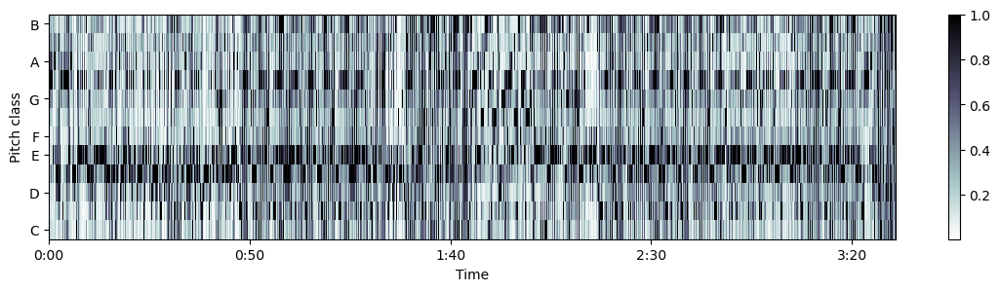

In [39]:
chromagram = librosa.feature.chroma_stft(y=song, sr=fr)
plt.figure(figsize=(14, 3))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', cmap='bone_r')
plt.colorbar()

Step2: I am going to round the resulting matrix using np.round with rounding parameter 0.

In [41]:
rounded_chromagram = np.round(chromagram , decimals = 0)
rounded_chromagram

array([[1., 1., 0., ..., 1., 1., 1.],
       [0., 1., 0., ..., 1., 1., 1.],
       [0., 0., 1., ..., 1., 1., 0.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 0., 1., ..., 1., 1., 1.],
       [1., 1., 0., ..., 1., 1., 1.]], dtype=float32)

Step3: I am going to count the number of each note using the result of Step3, and sketch a histogram.

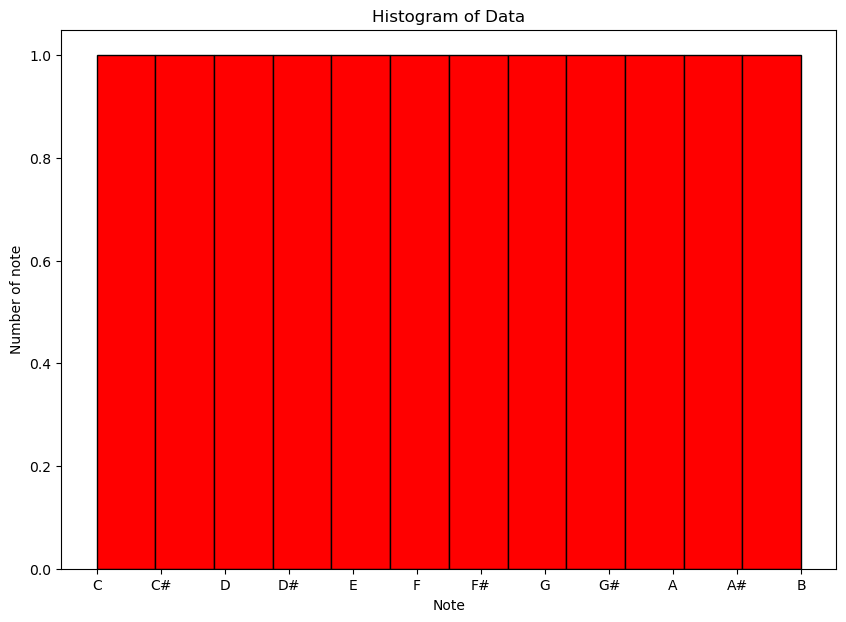

In [63]:
notes = ["C","C#","D","D#","E","F","F#","G","G#","A","A#","B"]
counts = {}
for i, row in enumerate(rounded_chromagram):
    count = np.count_nonzero(row)
    counts[notes[i]] = count
    
# Plot the histogram
plt.figure(figsize = (10,7))
plt.hist(counts, bins=12, color='red', edgecolor='black')

plt.title('Histogram of Data')
plt.xlabel('Note')
plt.ylabel('Number of note')

# Show the plot
plt.show()

Step4: I am going to display top 5 notes appearing in the song.

In [61]:
pitch_class_sums = chromagram.sum(axis=1)
sorted_indices = np.argsort(-pitch_class_sums)

print("Top 5 notes:")
for i in range(5):
    pitch_class_index = sorted_indices[i]
    note = notes[pitch_class_index]
    count = pitch_class_sums[pitch_class_index]
    print(f"{note}: {count:.2f}")

Top 5 notes:
E: 5653.15
D#: 5321.01
G#: 4495.61
B: 3728.40
C#: 3672.44
